<a href="https://colab.research.google.com/github/Bogula/AI_Music/blob/main/Super_Variations_MT_PyTorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Variation Maker based on Super Piano 3.

A stripped down version of Super Piano 3 to facilitate generating music in the style of a certain composer or a certain corpus of music, e.g. from a certain lute manuscript a bunch of piano / guitar riffs.

The idea is to upload all the  compositions of a certain style into the training directory and train the Music Transformer to capture the rules and intricacies of that corpus in order to generate more music of the captured vibe. 

Typically you need about 100 pieces, they should not be too diverse in rhythm and structure in order to distill the essence of the corpus. If you use short samples like 3 to 4 bar riffs, about 50 samples can be enough.

Just put your midi-files in a zip-file called Archiv.zip and avoid using spaces in the file names. Then everything should work out of the box. And the script will generate automatically one to n variation for each sample. 

I did not change the structure of the original piano transformer, added only some of the folders to make it easier to work with new corpora of music. 



Here are the original references:

## Super Piano 3: Google Music Transformer
## Generating Music with Long-Term structure
### Based on 2019 ICLR paper by Cheng-Zhi Anna Huang, Google Brain and Damon Gwinn's code/repo https://github.com/gwinndr/MusicTransformer-Pytorch

Huge thanks go out to the following people who contributed the code/repos used in this colab. Additional contributors are listed in the code as well.

1) Kevin-Yang https://github.com/jason9693/midi-neural-processor

2) gudgud96 for fixing Kevin's MIDI Encoder properly https://github.com/gudgud96

2) jinyi12, Zac Koh, Akamight, Zhang https://github.com/COMP6248-Reproducability-Challenge/music-transformer-comp6248

Thank you so much for your hard work and for sharing it with the world :)


###Setup Environment and Dependencies. Check GPU.

In [1]:
#@title Check if GPU (driver) is avaiiable (you do not want to run this on CPU, trust me)
!nvcc --version
!nvidia-smi

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0
Fri Jul 15 15:19:29 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |            

In [2]:
#@title Clone/Install all dependencies
!git clone https://github.com/asigalov61/midi-neural-processor
!git clone https://github.com/asigalov61/MusicTransformer-Pytorch
!pip install tqdm
!pip install progress
!pip install pretty-midi
!pip install pypianoroll
!pip install matplotlib
!pip install librosa
!pip install scipy
!pip install pillow
!apt install fluidsynth #Pip does not work for some reason. Only apt works
!pip install midi2audio
!pip install mir_eval
!cp /usr/share/sounds/sf2/FluidR3_GM.sf2 /content/font.sf2

Cloning into 'midi-neural-processor'...
remote: Enumerating objects: 26, done.
remote: Total 26 (delta 0), reused 0 (delta 0), pack-reused 26
Unpacking objects: 100% (26/26), done.
Cloning into 'MusicTransformer-Pytorch'...
remote: Enumerating objects: 385, done.
remote: Total 385 (delta 0), reused 0 (delta 0), pack-reused 385
Receiving objects: 100% (385/385), 102.18 KiB | 3.93 MiB/s, done.
Resolving deltas: 100% (201/201), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for progress: filename=progress-1.6-py3-none-any.whl size=9632 sha256=0df88eabbc9ed13605f83033b817f1434b7aeacc8eb3b7a225bd7cf199a7faea
  Stored in directory: /root/.cache/pip/wheels/8e/d7/61/498d8e27dc11e9805b01eb3539e2ee344436fc226daeb5fe87
Successfully built progress
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-whee

In [3]:
#@title Import all needed modules
import numpy as np
import pickle
import os
import sys
import math
import random
# For plotting
import pypianoroll
from pypianoroll import Multitrack, Track
import matplotlib
import matplotlib.pyplot as plt
#matplotlib.use('SVG')
#%matplotlib inline
#matplotlib.get_backend()
import mir_eval.display
import librosa
import librosa.display
# For rendering output audio
import pretty_midi
from midi2audio import FluidSynth
from google.colab import output
from IPython.display import display, Javascript, HTML, Audio

/usr/local/lib/python3.7/dist-packages/resampy/interpn.py:114: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  _resample_loop_p(x, t_out, interp_win, interp_delta, num_table, scale, y)


#Load your Music Corpus

In [7]:
#@title Prepare directory sctructure and MIDI processor
%cd /content/
!mv midi-neural-processor midi_processor
%cd /content/MusicTransformer-Pytorch/

/content
mv: cannot stat 'midi-neural-processor': No such file or directory
/content/MusicTransformer-Pytorch


#Your own Custom MIDI DataSet

In [8]:
#@title Create directory structure for the DataSet and prep MIDI processor

!mkdir '/content/MusicTransformer-Pytorch/dataset/corpus/'
!mkdir '/content/MusicTransformer-Pytorch/dataset/corpus/train'
!mkdir '/content/MusicTransformer-Pytorch/dataset/corpus/test'
!mkdir '/content/MusicTransformer-Pytorch/dataset/corpus/val'
!mkdir '/content/MusicTransformer-Pytorch/dataset/corpus/custom_midis'

%cd /content/
#!mv midi-neural-processor midi_processor
%cd /content/MusicTransformer-Pytorch/

mkdir: cannot create directory ‘/content/MusicTransformer-Pytorch/dataset/corpus/’: File exists
mkdir: cannot create directory ‘/content/MusicTransformer-Pytorch/dataset/corpus/train’: File exists
mkdir: cannot create directory ‘/content/MusicTransformer-Pytorch/dataset/corpus/test’: File exists
mkdir: cannot create directory ‘/content/MusicTransformer-Pytorch/dataset/corpus/val’: File exists
mkdir: cannot create directory ‘/content/MusicTransformer-Pytorch/dataset/corpus/custom_midis’: File exists
/content
/content/MusicTransformer-Pytorch


In [9]:
#@title Upload your custom MIDI DataSet to created "dataset/corpus/custom_midis" folder through this cell or manually through any other means. If you use Archiv.zip as zip file name , the next cell helps you unpack everything. 
from google.colab import files
%cd '/content/MusicTransformer-Pytorch/dataset/corpus/custom_midis'
uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

/content/MusicTransformer-Pytorch/dataset/corpus/custom_midis


MessageError: ignored

In [10]:
!unzip Archiv.zip
!rm -r __MACOSX/
!rm Archiv.zip

Archive:  Archiv.zip
  inflating: 05_fantasia_05.mid      
  inflating: 01_fantasia_01.mid      
  inflating: 02_fantasia_02.mid      
  inflating: 03_fantasia_03.mid      
  inflating: 04_fantasia_04.mid      
  inflating: 06_fantasia_06.mid      
  inflating: 07_fantasia_07.mid      
  inflating: 08_fantasia_08.mid      
  inflating: 09_fantasia_09.mid      
  inflating: 10_fantasia_10.mid      
  inflating: 11_fantasia_11.mid      
  inflating: 12_fantasia_12.mid      
  inflating: 13_fantasia_13.mid      
  inflating: 14_fantasia_14.mid      
  inflating: 15_fantasia_15.mid      
  inflating: 16_fantasia_16.mid      
  inflating: 17_fantasia_17.mid      
  inflating: 18_fantasia_18.mid      
  inflating: 19_fantasia_19.mid      
  inflating: 20_fantasia_20.mid      
  inflating: 21_fantasia_21.mid      
  inflating: 22_fantasia_22.mid      
  inflating: 23_pavana_01.mid        
  inflating: 24_pavana_02.mid        
  inflating: 25_pavana_03.mid        
  inflating: 26_pavana_04.mid

For now, we are going to split the dataset by random into "test"/"val" dirs which is not ideal. So feel free to modify the code to your liking to achieve better training results with this implementation.

In [11]:
#@title Process your custom MIDI DataSet :)
%cd /content/MusicTransformer-Pytorch
from processor import encode_midi

import os
import random

%cd '/content/MusicTransformer-Pytorch/dataset/corpus/custom_midis'

custom_MIDI_DataSet_dir = '/content/MusicTransformer-Pytorch/dataset/corpus/custom_midis'

train_dir = '/content/MusicTransformer-Pytorch/dataset/corpus/train' # split_type = 0
test_dir = '/content/MusicTransformer-Pytorch/dataset/corpus/test' # split_type = 1  
val_dir = '/content/MusicTransformer-Pytorch/dataset/corpus/val' # split_type = 2

total_count = 0
train_count = 0
val_count   = 0
test_count  = 0

f_ext = '.pickle'
fileList = os.listdir(custom_MIDI_DataSet_dir)
for file in fileList:
     # we gonna split by a random selection for now
    
    split = random.randint(1, 2)
    if (split == 0):
         o_file = os.path.join(train_dir, file+f_ext)
         train_count += 1

    elif (split == 2):
         o_file0 = os.path.join(train_dir, file+f_ext)
         train_count += 1
         o_file = os.path.join(val_dir, file+f_ext)
         val_count += 1

    elif (split == 1):
         o_file0 = os.path.join(train_dir, file+f_ext)
         train_count += 1
         o_file = os.path.join(test_dir, file+f_ext)
         test_count += 1
    try:
      prepped = encode_midi(file)
      o_stream = open(o_file0, "wb")
      pickle.dump(prepped, o_stream)
      o_stream.close()

      prepped = encode_midi(file)
      o_stream = open(o_file, "wb")
      pickle.dump(prepped, o_stream)
      o_stream.close()
   
      print(file)
      print(o_file)
      print('Converted!')  
    except KeyboardInterrupt: 
      raise   
    except:
      print('Bad file. Skipping...')

print('Done')
print("Num Train:", train_count)
print("Num Val:", val_count)
print("Num Test:", test_count)
print("Total Count:", train_count)

%cd /content/MusicTransformer-Pytorch

/content/MusicTransformer-Pytorch
/content/MusicTransformer-Pytorch/dataset/corpus/custom_midis
23_pavana_01.mid
/content/MusicTransformer-Pytorch/dataset/corpus/val/23_pavana_01.mid.pickle
Converted!
53_fantasia_33.mid
/content/MusicTransformer-Pytorch/dataset/corpus/test/53_fantasia_33.mid.pickle
Converted!
22_fantasia_22.mid
/content/MusicTransformer-Pytorch/dataset/corpus/test/22_fantasia_22.mid.pickle
Converted!
59_fantasia_35.mid
/content/MusicTransformer-Pytorch/dataset/corpus/test/59_fantasia_35.mid.pickle
Converted!
14_fantasia_14.mid
/content/MusicTransformer-Pytorch/dataset/corpus/val/14_fantasia_14.mid.pickle
Converted!
04_fantasia_04.mid
/content/MusicTransformer-Pytorch/dataset/corpus/val/04_fantasia_04.mid.pickle
Converted!
07_fantasia_07.mid
/content/MusicTransformer-Pytorch/dataset/corpus/val/07_fantasia_07.mid.pickle
Converted!
44_fantasia_24.mid
/content/MusicTransformer-Pytorch/dataset/corpus/test/44_fantasia_24.mid.pickle
Converted!
61_fantasia_37.mid
/content/Musi

#Train the Model

In [12]:
#@title Activate Tensorboard Graphs/Stats to monitor/evaluate model perfomance during and after training runs
# Load the TensorBoard notebook extension
%reload_ext tensorboard
import tensorflow as tf
import datetime, os
%tensorboard --logdir /content/MusicTransformer-Pytorch/rpr

<IPython.core.display.Javascript object>

In [13]:
#@title Start to Train the Model
%cd /content/MusicTransformer-Pytorch
batch_size = 2 #@param {type:"slider", min:0, max:8, step:1}
number_of_training_epochs = 100 #@param {type:"slider", min:0, max:200, step:1}
maximum_output_MIDI_sequence = 512 #@param {type:"slider", min:0, max:8192, step:128}
!python3 train.py -input_dir dataset/corpus -output_dir rpr --rpr -batch_size=$batch_size -epochs=$number_of_training_epochs -max_sequence=$maximum_output_MIDI_sequence #-n_layers -num_heads -d_model -dim_feedforward

Die letzten 5000 Zeilen der Streamingausgabe wurden abgeschnitten.

Epoch 77  Batch 16 / 25
LR: 0.00033471142538199977
Train loss: 0.8474662899971008

Time (s): 0.028326034545898438

Epoch 77  Batch 17 / 25
LR: 0.00033488611819274195
Train loss: 1.0447241067886353

Time (s): 0.02706742286682129

Epoch 77  Batch 18 / 25
LR: 0.00033506081100348413
Train loss: 0.9705447554588318

Time (s): 0.02696681022644043

Epoch 77  Batch 19 / 25
LR: 0.0003352355038142263
Train loss: 1.4024670124053955

Time (s): 0.030169963836669922

Epoch 77  Batch 20 / 25
LR: 0.00033541019662496844
Train loss: 0.8730931878089905

Time (s): 0.028081417083740234

Epoch 77  Batch 21 / 25
LR: 0.0003355848894357106
Train loss: 0.994921863079071

Time (s): 0.02844715118408203

Epoch 77  Batch 22 / 25
LR: 0.0003357595822464528
Train loss: 0.9960628747940063

Time (s): 0.029561281204223633

Epoch 77  Batch 23 / 25
LR: 0.000335934275057195
Train loss: 0.8843105435371399

Time (s): 0.029015541076660156

Epoch 77  Batch 24 / 

In [18]:
#@title Re-Start Training from a certain checkpoint and epoch
batch_size = 2 #@param {type:"slider", min:0, max:8, step:1}
number_of_training_epochs = 200 #@param {type:"slider", min:0, max:200, step:1}
maximum_output_MIDI_sequence = 512 #@param {type:"slider", min:0, max:8192, step:128}
saved_checkpoint_full_path = "/content/MusicTransformer-Pytorch/rpr/weights/epoch_0100.pickle" #@param {type:"string"}
continue_epoch_number =  100#@param {type:"integer"}

!python3 train.py -input_dir dataset/corpus -output_dir rpr --rpr -batch_size=$batch_size -epochs=$number_of_training_epochs -max_sequence=$maximum_output_MIDI_sequence -continue_weights $saved_checkpoint_full_path -continue_epoch $continue_epoch_number #-n_layers -num_heads -d_model -dim_feedforward

Die letzten 5000 Zeilen der Streamingausgabe wurden abgeschnitten.

Epoch 177  Batch 16 / 25
LR: 0.0006650441646552722
Train loss: 0.7343381643295288

Time (s): 0.028449535369873047

Epoch 177  Batch 17 / 25
LR: 0.0006649688780568927
Train loss: 0.45497754216194153

Time (s): 0.029026269912719727

Epoch 177  Batch 18 / 25
LR: 0.0006648936170212766
Train loss: 0.5629290342330933

Time (s): 0.03026103973388672

Epoch 177  Batch 19 / 25
LR: 0.0006648183815339612
Train loss: 0.626656711101532

Time (s): 0.0272977352142334

Epoch 177  Batch 20 / 25
LR: 0.0006647431715804953
Train loss: 0.4023291766643524

Time (s): 0.026978731155395508

Epoch 177  Batch 21 / 25
LR: 0.0006646679871464393
Train loss: 0.552074670791626

Time (s): 0.028197765350341797

Epoch 177  Batch 22 / 25
LR: 0.0006645928282173646
Train loss: 0.28906479477882385

Time (s): 0.02705526351928711

Epoch 177  Batch 23 / 25
LR: 0.0006645176947788547
Train loss: 0.7757303714752197

Time (s): 0.027253389358520508

Epoch 177  Batch

###Evaluate the resulted models

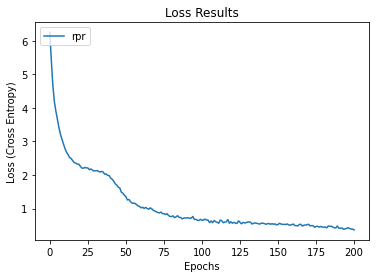

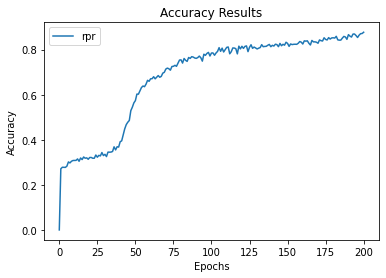

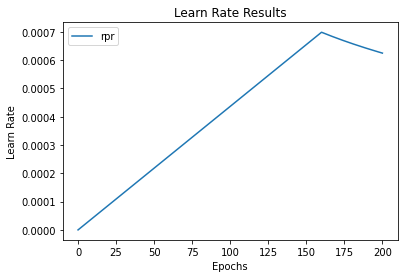

In [19]:
#@title Graph the results
import argparse
import os
import csv
import math
import matplotlib.pyplot as plt

RESULTS_FILE = "results.csv"
EPOCH_IDX = 0
LR_IDX = 1
EVAL_LOSS_IDX = 4
EVAL_ACC_IDX = 5

SPLITTER = '?'


def graph_results(input_dirs="/content/MusicTransformer-Pytorch/rpr/results", output_dir=None, model_names=None, epoch_start=0, epoch_end=None):
    """
    ----------
    Author: Damon Gwinn
    ----------
    Graphs model training and evaluation data
    ----------
    """

    input_dirs = input_dirs.split(SPLITTER)

    if(model_names is not None):
        model_names = model_names.split(SPLITTER)
        if(len(model_names) != len(input_dirs)):
            print("Error: len(model_names) != len(input_dirs)")
            return

    #Initialize Loss and Accuracy arrays
    loss_arrs = []
    accuracy_arrs = []
    epoch_counts = []
    lrs = []

    for input_dir in input_dirs:
        loss_arr = []
        accuracy_arr = []
        epoch_count = []
        lr_arr = []

        f = os.path.join(input_dir, RESULTS_FILE)
        with open(f, "r") as i_stream:
            reader = csv.reader(i_stream)
            next(reader)

            lines = [line for line in reader]

        if(epoch_end is None):
            epoch_end = math.inf

        epoch_start = max(epoch_start, 0)
        epoch_start = min(epoch_start, epoch_end)

        for line in lines:
            epoch = line[EPOCH_IDX]
            lr = line[LR_IDX]
            accuracy = line[EVAL_ACC_IDX]
            loss = line[EVAL_LOSS_IDX]

            if(int(epoch) >= epoch_start and int(epoch) < epoch_end):
                accuracy_arr.append(float(accuracy))
                loss_arr.append(float(loss))
                epoch_count.append(int(epoch))
                lr_arr.append(float(lr))

        loss_arrs.append(loss_arr)
        accuracy_arrs.append(accuracy_arr)
        epoch_counts.append(epoch_count)
        lrs.append(lr_arr)

    if(output_dir is not None):
        try:
            os.mkdir(output_dir)
        except OSError:
            print ("Creation of the directory %s failed" % output_dir)
        else:
            print ("Successfully created the directory %s" % output_dir)

    ##### LOSS #####
    for i in range(len(loss_arrs)):
        if(model_names is None):
            name = None
        else:
            name = model_names[i]

        #Create and save plots to output folder
        plt.plot(epoch_counts[i], loss_arrs[i], label=name)
        plt.title("Loss Results")
        plt.ylabel('Loss (Cross Entropy)')
        plt.xlabel('Epochs')
        fig1 = plt.gcf()

    plt.legend(loc="upper left")

    if(output_dir is not None):
        fig1.savefig(os.path.join(output_dir, 'loss_graph.png'))

    plt.show()

    ##### ACCURACY #####
    for i in range(len(accuracy_arrs)):
        if(model_names is None):
            name = None
        else:
            name = model_names[i]

        #Create and save plots to output folder
        plt.plot(epoch_counts[i], accuracy_arrs[i], label=name)
        plt.title("Accuracy Results")
        plt.ylabel('Accuracy')
        plt.xlabel('Epochs')
        fig2 = plt.gcf()

    plt.legend(loc="upper left")

    if(output_dir is not None):
        fig2.savefig(os.path.join(output_dir, 'accuracy_graph.png'))

    plt.show()

    ##### LR #####
    for i in range(len(lrs)):
        if(model_names is None):
            name = None
        else:
            name = model_names[i]

        #Create and save plots to output folder
        plt.plot(epoch_counts[i], lrs[i], label=name)
        plt.title("Learn Rate Results")
        plt.ylabel('Learn Rate')
        plt.xlabel('Epochs')
        fig2 = plt.gcf()

    plt.legend(loc="upper left")

    if(output_dir is not None):
        fig2.savefig(os.path.join(output_dir, 'lr_graph.png'))

    plt.show()
graph_results('/content/MusicTransformer-Pytorch/rpr/results', model_names='rpr')

To have the model continue your custom MIDI enter the following into the custom_MIDI field below:

-primer_file '/content/some_dir/some_seed_midi.mid'

For example: -primer_file '/content/MusicTransformer-Pytorch/seed.mid'

# Generate a test exampl eand Explore the output :)

In [21]:
2#@title Generate a test sample
number_of_tokens_to_generate = 512 #@param {type:"slider", min:1, max:2048, step:1}
priming_sequence_length =24 #@param {type:"slider", min:1, max:2048, step:8}
maximum_possible_output_sequence = 512 #@param {type:"slider", min:0, max:2048, step:8}
select_model = "/content/MusicTransformer-Pytorch/rpr/weights/epoch_0100.pickle"
custom_MIDI = "/content/MusicTransformer-Pytorch/dataset/corpus/custom_midis/01_fantasia_01.mid" #@param {type:"string"}

#fileList = os.listdir(custom_MIDI_DataSet_dir)


import processor
from processor import encode_midi, decode_midi


!python generate.py -midi_root dataset/corpus/ -output_dir output -model_weights=$select_model --rpr -target_seq_length=$number_of_tokens_to_generate -num_prime=$priming_sequence_length -max_sequence=$maximum_possible_output_sequence -primer_file $custom_MIDI #-beam=2 #

print('Successfully exported the output to output folder. To primer.mid and rand.mid')

# set the src and play
FluidSynth("/content/font.sf2").midi_to_audio('/content/MusicTransformer-Pytorch/output/rand.mid', '/content/MusicTransformer-Pytorch/output/output.wav')

from google.colab import files
#files.download('/content/MusicTransformer-Pytorch/output/rand.mid')
#files.download('/content/MusicTransformer-Pytorch/output/primer.mid')

Audio('/content/MusicTransformer-Pytorch/output/output.wav')


midi_root: dataset/corpus/
output_dir: output
primer_file: /content/MusicTransformer-Pytorch/dataset/corpus/custom_midis/01_fantasia_01.mid
force_cpu: False

target_seq_length: 512
num_prime: 24
model_weights: /content/MusicTransformer-Pytorch/rpr/weights/epoch_0100.pickle
beam: 0

rpr: True
max_sequence: 512
n_layers: 6
num_heads: 8
d_model: 512

dim_feedforward: 1024

Using primer file: /content/MusicTransformer-Pytorch/dataset/corpus/custom_midis/01_fantasia_01.mid
RAND DIST
Generating sequence of max length: 512
50 / 512
100 / 512
150 / 512
200 / 512
250 / 512
300 / 512
350 / 512
400 / 512
450 / 512
500 / 512
info removed pitch: 73
info removed pitch: 44
Successfully exported the output to output folder. To primer.mid and rand.mid


In [ ]:
#@title General Parameters

sound_length = 512
priming_length = 12

#!cp "/content/generate.py" "/content/train"


In [ ]:
2#@title Generate a bunch of variations
number_of_tokens_to_generate = 512 #@param {type:"slider", min:1, max:2048, step:1}
priming_sequence_length =12 #@param {type:"slider", min:1, max:2048, step:8}
maximum_possible_output_sequence = 512 #@param {type:"slider", min:0, max:2048, step:8}
select_model = "/content/MusicTransformer-Pytorch/rpr/weights/epoch_0200.pickle"
custom_MIDI = "/content/MusicTransformer-Pytorch/dataset/corpus/custom_midis/PianoRiff01.mid" #@param {type:"string"}


custom_MIDI_DataSet_dir = '/content/MusicTransformer-Pytorch/dataset/corpus/custom_midis'

import processor
from processor import encode_midi, decode_midi

fileList = os.listdir(custom_MIDI_DataSet_dir)
for file in fileList:
  print(file)
  custom_MIDI = "/content/MusicTransformer-Pytorch/dataset/corpus/custom_midis/"+file 
  !python generate.py -midi_root dataset/corpus/ -output_dir output -model_weights=$select_model --rpr -target_seq_length=$number_of_tokens_to_generate -num_prime=$priming_sequence_length -max_sequence=$maximum_possible_output_sequence -primer_file $custom_MIDI #-beam=2 #

print('Successfully exported the output to output folder. To primer.mid and rand.mid')

# set the src and play
FluidSynth("/content/font.sf2").midi_to_audio('/content/MusicTransformer-Pytorch/output/rand.mid', '/content/MusicTransformer-Pytorch/output/output.wav')

from google.colab import files
#files.download('/content/MusicTransformer-Pytorch/output/rand.mid')
#files.download('/content/MusicTransformer-Pytorch/output/primer.mid')

Audio('/content/MusicTransformer-Pytorch/output/output.wav')


23_pavana_01.mid
midi_root: dataset/corpus/
output_dir: output
primer_file: /content/MusicTransformer-Pytorch/dataset/corpus/custom_midis/23_pavana_01.mid
force_cpu: False

target_seq_length: 512
num_prime: 12
model_weights: /content/MusicTransformer-Pytorch/rpr/weights/epoch_0100.pickle
beam: 0

rpr: True
max_sequence: 512
n_layers: 6
num_heads: 8
d_model: 512

dim_feedforward: 1024

Using primer file: /content/MusicTransformer-Pytorch/dataset/corpus/custom_midis/23_pavana_01.mid
RAND DIST
Generating sequence of max length: 512
50 / 512
100 / 512
150 / 512
200 / 512
250 / 512
300 / 512
350 / 512
400 / 512
450 / 512
500 / 512
info removed pitch: 46
info removed pitch: 59
info removed pitch: 47
info removed pitch: 59
53_fantasia_33.mid
midi_root: dataset/corpus/
output_dir: output
primer_file: /content/MusicTransformer-Pytorch/dataset/corpus/custom_midis/53_fantasia_33.mid
force_cpu: False

target_seq_length: 512
num_prime: 12
model_weights: /content/MusicTransformer-Pytorch/rpr/weights

In [1]:
%cd /content/MusicTransformer-Pytorch/output
!zip midis.zip *.mid
from google.colab import files
files.download('midis.zip')


/content/MusicTransformer-Pytorch/output
  adding: primer.mid (deflated 6%)
  adding: rand.mid (deflated 50%)
  adding: rand.mid22_fantasia_22.mid (deflated 54%)
  adding: rand.mid23_pavana_01.mid (deflated 49%)
  adding: rand.mid53_fantasia_33.mid (deflated 51%)
  adding: rand.mid57_tentos_04.mid (deflated 53%)
  adding: rand.mid59_fantasia_35.mid (deflated 49%)
  adding: rand.mid61_fantasia_37.mid (deflated 47%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>